In [ ]:
pip install pyproj

In [ ]:
!pip install geopandas

In [ ]:
!pip uninstall cython -y
!pip install cython
!pip uninstall cartopy -y
!pip install cartopy

Found existing installation: Cython 3.0.5
Uninstalling Cython-3.0.5:
  Successfully uninstalled Cython-3.0.5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 43.0 MB/s eta 0:00:00


In [ ]:
!apt-get -qq install python-cartopy python3-cartopy
!pip uninstall -y shapely    # cartopy and shapely aren't friends (early 2020)
!pip install shapely --no-binary shapely

E: Unable to locate package python-cartopy
Found existing installation: shapely 2.0.2
Uninstalling shapely-2.0.2:
  Successfully uninstalled shapely-2.0.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 279.7/279.7 kB 5.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for shapely: filename=shapely-2.0.2-cp310-cp310-linux_x86_64.whl size=1027136 sha256=06726b1f09165c1ac2226b2f3eb48703da77abc7314eededa7c9e9b6f86e2000
  Stored in directory: /root/.cache/pip/wheels/1f/6b/52/14cb4558cddc0fd89de08f0e1fd08f816f4f3e1969311377c6
Successfully built shapely
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
li

In [ ]:
import pandas as pd
import pyproj
import math
import matplotlib.pyplot as plt
import seaborn as sb
import urllib.request


%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm

import numpy as np

import cartopy
import cartopy.crs as ccrs                   # for projections
import cartopy.feature as cfeature           # for features
import cartopy.io.shapereader as shapereader
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from cartopy.feature.nightshade import Nightshade
import geopandas as gpd
import random
from shapely.geometry import Point, Polygon
import time
from scipy.spatial import distance

In [ ]:
ruta = 'https://raw.githubusercontent.com/fmoreno4/datasets/main/eventos_dengue_2020.csv'
df = pd.read_csv(ruta)
df

,ID,fec_not,semana,año,edad_,uni_med_,sexo_,cod_pais_o,cod_dpto_o,cod_mun_o,...,hipotension,hepatomegalia,hemorragia_mucosa,hipotermia,caida_plaquetas,acum_liquido,aum_hematocrito,conducta,latitud,longitud
0,1,17/01/2020,1,2020,25,1,F,170,68,276,...,2,2,2,2,2,2,2,1. Ambulatorio,7.076011,-73.102501
1,2,10/01/2020,1,2020,24,1,M,170,68,276,...,2,2,2,2,2,2,2,1. Ambulatorio,7.079495,-73.105400
2,3,12/01/2020,1,2020,58,1,M,170,68,276,...,2,2,2,2,2,2,2,1. Ambulatorio,7.090290,-73.091003
3,4,12/01/2020,1,2020,29,1,F,170,68,276,...,2,2,2,2,2,2,2,1. Ambulatorio,7.067435,-73.090958
4,5,10/01/2020,1,2020,56,1,F,170,68,276,...,2,2,2,2,1,2,2,2. Hospitalizacion piso,7.066905,-73.104980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1257,1258,7/03/2020,9,2020,36,1,F,170,68,276,...,2,2,1,2,2,2,2,1. Ambulatorio,7.072610,-73.099487
1258,1259,13/03/2020,9,2020,42,1,M,170,68,276,...,2,2,2,2,1,2,1,2. Hospitalizacion piso,7.065252,-73.103607
1259,1260,8/03/2020,9,2020,2,1,M,170,68,276,...,2,2,2,2,2,2,2,1. Ambulatorio,7.091391,-73.103264
1260,1261,11/03/2020,9,2020,12,1,F,170,68,276,...,2,2,2,2,2,2,2,1. Ambulatorio,7.061083,-73.097000


In [ ]:
#Se formatean los datos de fecha
from datetime import datetime

df['fec_not2'] = pd.to_datetime(df['fec_not'], format="%d/%m/%Y")
df['fecha_contagio2'] = pd.to_datetime(df['fecha_contagio'], format="%d/%m/%Y")
df['inicio_sintomas2'] = pd.to_datetime(df['inicio_sintomas'], format="%d/%m/%Y")
df['fec_hos_2'] = pd.to_datetime(df['fec_hos_'], format="%d/%m/%Y")
df

,ID,fec_not,semana,año,edad_,uni_med_,sexo_,cod_pais_o,cod_dpto_o,cod_mun_o,...,caida_plaquetas,acum_liquido,aum_hematocrito,conducta,latitud,longitud,fec_not2,fecha_contagio2,inicio_sintomas2,fec_hos_2
0,1,17/01/2020,1,2020,25,1,F,170,68,276,...,2,2,2,1. Ambulatorio,7.076011,-73.102501,2020-01-17,2020-01-17,2020-01-10,NaT
1,2,10/01/2020,1,2020,24,1,M,170,68,276,...,2,2,2,1. Ambulatorio,7.079495,-73.105400,2020-01-10,2020-01-10,2020-01-07,NaT
2,3,12/01/2020,1,2020,58,1,M,170,68,276,...,2,2,2,1. Ambulatorio,7.090290,-73.091003,2020-01-12,2020-01-12,2020-01-08,NaT
3,4,12/01/2020,1,2020,29,1,F,170,68,276,...,2,2,2,1. Ambulatorio,7.067435,-73.090958,2020-01-12,2020-01-10,2020-01-06,NaT
4,5,10/01/2020,1,2020,56,1,F,170,68,276,...,1,2,2,2. Hospitalizacion piso,7.066905,-73.104980,2020-01-10,2020-01-10,2020-01-07,2020-01-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1257,1258,7/03/2020,9,2020,36,1,F,170,68,276,...,2,2,2,1. Ambulatorio,7.072610,-73.099487,2020-03-07,2020-03-06,2020-03-03,NaT
1258,1259,13/03/2020,9,2020,42,1,M,170,68,276,...,1,2,1,2. Hospitalizacion piso,7.065252,-73.103607,2020-03-13,2020-03-13,2020-03-06,2020-03-13
1259,1260,8/03/2020,9,2020,2,1,M,170,68,276,...,2,2,2,1. Ambulatorio,7.091391,-73.103264,2020-03-08,2020-03-08,2020-03-04,NaT
1260,1261,11/03/2020,9,2020,12,1,F,170,68,276,...,2,2,2,1. Ambulatorio,7.061083,-73.097000,2020-03-11,2020-03-11,2020-03-05,NaT


#Limpieza de Datos

In [ ]:
df_copy_l = df[['latitud','longitud']].copy()

In [ ]:
df_copy_l

,latitud,longitud
0,7.076011,-73.102501
1,7.079495,-73.105400
2,7.090290,-73.091003
3,7.067435,-73.090958
4,7.066905,-73.104980
...,...,...
1257,7.072610,-73.099487
1258,7.065252,-73.103607
1259,7.091391,-73.103264
1260,7.061083,-73.097000


In [ ]:
#Se carga la cartografía de Floridablanca
url = 'https://raw.githubusercontent.com/fmoreno4/cd-files/main/'

file_list = ["68276_urbano.cpg", "68276_urbano.dbf", "68276_urbano.prj", "68276_urbano.shp", "68276_urbano.shx"]

for file in file_list:
    urllib.request.urlretrieve(url+file, file)

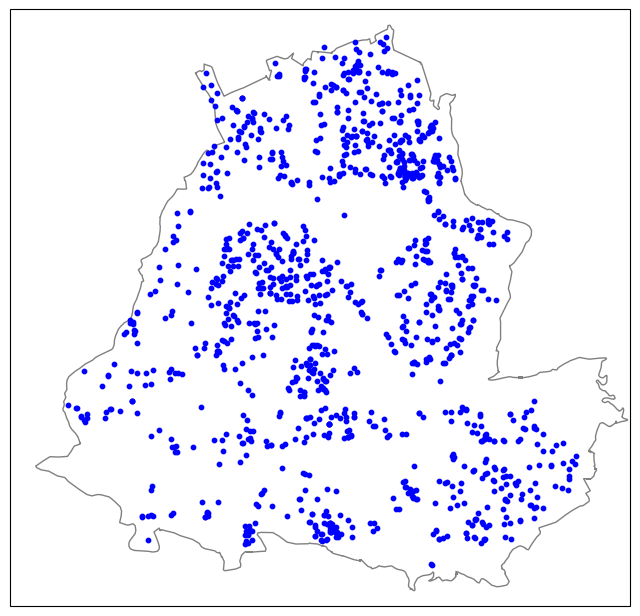

In [ ]:
subplot_kw = dict(projection=ccrs.PlateCarree())

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=subplot_kw)

# Puntos Floridablanca
lower_lon = -73.1215
upper_lon = -73.0732
lower_lat = 7.054
upper_lat = 7.1005

ax.set_extent([lower_lon, upper_lon, lower_lat, upper_lat])

reader = shapereader.Reader('68276_urbano.shp')

for poli in reader.geometries():
    ax.add_geometries([poli], ccrs.PlateCarree(), facecolor='white', edgecolor='gray')

ax.scatter(df_copy_l['longitud'], df_copy_l['latitud'], zorder=10, c='b', s=10)

plt.show()

#Establecer límites

In [ ]:
df_copy_l = df_copy_l[(df_copy_l['latitud']<= upper_lat)&(df_copy_l['latitud']>= lower_lat)&(df_copy_l['longitud']<= upper_lon)&(df_copy_l['longitud']>= lower_lon)]
df_copy_l

,latitud,longitud
0,7.076011,-73.102501
1,7.079495,-73.105400
2,7.090290,-73.091003
3,7.067435,-73.090958
4,7.066905,-73.104980
...,...,...
1257,7.072610,-73.099487
1258,7.065252,-73.103607
1259,7.091391,-73.103264
1260,7.061083,-73.097000


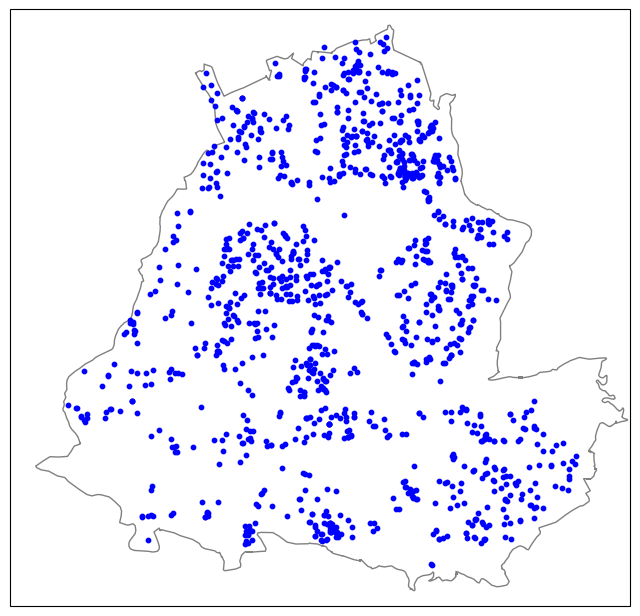

In [ ]:
subplot_kw = dict(projection=ccrs.PlateCarree())

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=subplot_kw)

# Puntos Floridablanca
lower_lon = -73.1215
upper_lon = -73.0732
lower_lat = 7.054
upper_lat = 7.1005

ax.set_extent([lower_lon, upper_lon, lower_lat, upper_lat])

reader = shapereader.Reader('68276_urbano.shp')

for poli in reader.geometries():
    ax.add_geometries([poli], ccrs.PlateCarree(), facecolor='white', edgecolor='gray')

ax.scatter(df_copy_l['longitud'], df_copy_l['latitud'], zorder=10, c='b', s=10)

plt.show()

In [ ]:
df_copy_l.isnull().sum()

latitud     0
longitud    0
dtype: int64

In [ ]:
df_copy_l.isna().sum()

latitud     0
longitud    0
dtype: int64

No hay necesidad de limpiar el dataframe deibdo a que no hay datos nulos ni nan.

# Conteo

In [ ]:
#Creación de la proyección
P = pyproj.Proj(proj='utm', zone=18, ellps='WGS84', preserve_units=True)

In [ ]:
#Se convertirán las coordenadas geográficas a UTM
df_copy_l['x'], df_copy_l['y'] = P(df_copy_l['longitud'], df_copy_l['latitud'])
df_copy_l

,latitud,longitud,x,y
0,7.076011,-73.102501,709584.027559,782579.281866
1,7.079495,-73.105400,709262.121378,782963.354103
2,7.090290,-73.091003,710847.924654,784163.825097
3,7.067435,-73.090958,710863.366771,781635.895608
4,7.066905,-73.104980,709314.159319,781570.969374
...,...,...,...,...
1257,7.072610,-73.099487,709918.546763,782204.438977
1258,7.065252,-73.103607,709466.644754,781388.734012
1259,7.091391,-73.103264,709492.782783,784279.996264
1260,7.061083,-73.097000,710198.574916,780930.648555


In [ ]:
x_max = df_copy_l['x'].max()
x_min = df_copy_l['x'].min()
y_max = df_copy_l['y'].max()
y_min = df_copy_l['y'].min()

In [ ]:
resolucion = 10
cuadrados_colum = math.ceil((x_max - x_min)/resolucion)
cuadrados_filas = math.ceil((y_max - y_min)/resolucion)
print(cuadrados_colum, cuadrados_filas)

438 455


In [ ]:
matr=[]
matr = [[0 for  i in range(cuadrados_colum)] for i in range(cuadrados_filas)]

In [ ]:
len(matr[0])

438

In [ ]:
for indice, fila in df_copy_l.iterrows():
  x_t = fila['x']
  y_t = fila['y']
  distancia_x = math.floor((x_t - x_min)/resolucion)
  distancia_y = math.floor((y_t - y_min)/resolucion)
  matr[distancia_y][distancia_x] = matr[distancia_y][distancia_x]+1

In [ ]:
for i in matr:
  print(i)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
suma = 0
for fila in matr:
    for elemento in fila:
        suma += elemento
print("La suma de todos los números en la matriz es:", suma)

La suma de todos los números en la matriz es: 1262


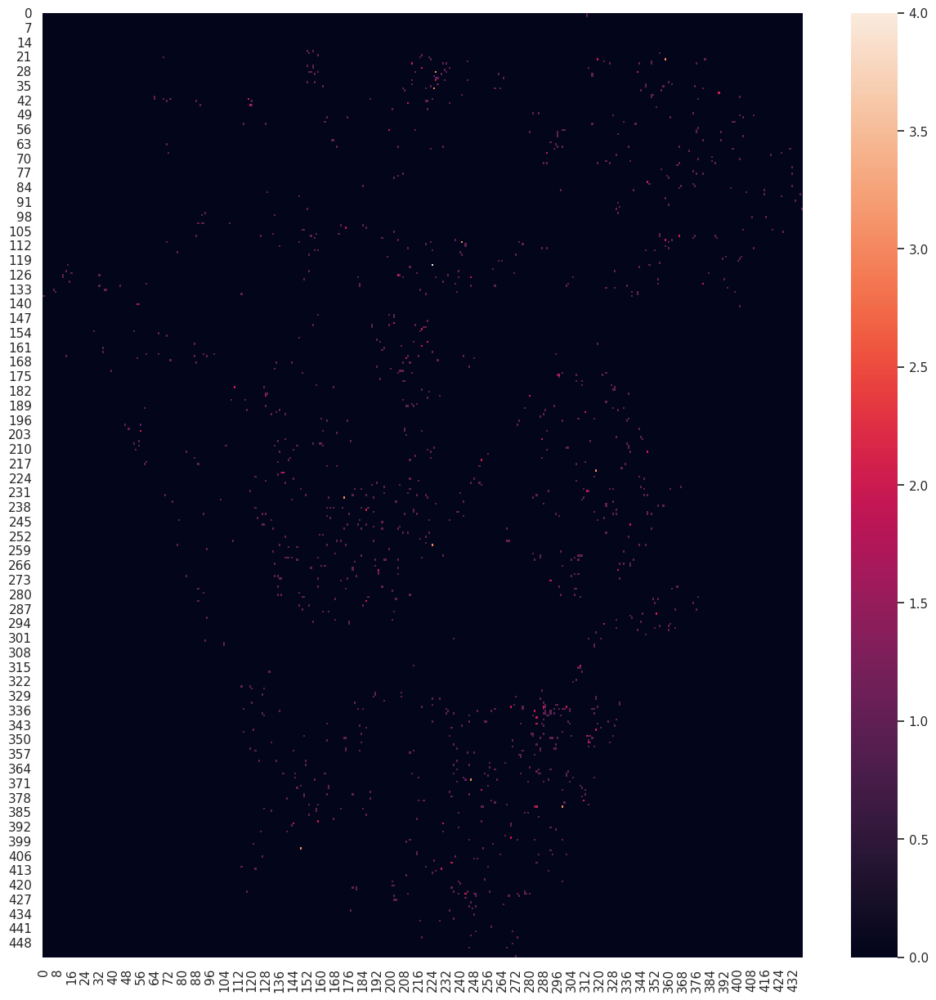

In [ ]:
#Visualizacion de datos
import seaborn as sns
sns.set(rc = {'figure.figsize':(15,15)})
p=sns.heatmap(matr)

In [ ]:
def uniforme(d,r):
  k = 1
  return k
def triangular(d,r):
  k = 1-(d/r)
  return k
def gaussiana(d,r):
  k = (math.e)**(-((d**2)/(2*(r**2))))
  return k
def epanechnikov(d,r):
  k = 1-((d**2)/(r**2))
  return k
def exponencial(d,r):
  k = (math.e)**(d/r)
  return k
def coseno(d,r):
  k = math.cos((math.pi*d)/(2*r))
  return k

In [ ]:
def kernel(tipo, d, r):
  if tipo == 1:
    k = uniforme(d,r)
  elif tipo == 2:
    k = triangular(d,r)
  elif tipo == 3:
    k = gaussiana(d,r)
  elif tipo == 4:
    k = epanechnikov(d,r)
  elif tipo == 5:
    k = exponencial(d,r)
  elif tipo == 6:
    k = coseno(d,r)
  kernel = k/(math.pi*(r**2))
  return kernel

In [ ]:
def KDE(resolucion, ancho_banda, matriz_conteo, tipo):
  matriz_dens=[]
  matriz_dens = [[0 for  i in range(cuadrados_colum)] for i in range(cuadrados_filas)]
  r = math.ceil(ancho_banda/resolucion)
  for i in range(cuadrados_filas):
    y_ini = i-r
    y_final = i+r
    if y_ini < 0 :
      y_ini = 0
    if y_final > cuadrados_filas:
      y_final = cuadrados_filas
    for j in range (cuadrados_colum):
      x_ini = j - r
      x_final = j + r
      if x_ini < 0 :
        x_ini = 0
      if x_final > cuadrados_colum:
        x_final = cuadrados_colum
      for k in range(y_ini, y_final):
        for l in range (x_ini, x_final):
          dist = math.sqrt(((j - l)**2) + ((i-k)**2))
          if dist <= r :
            matriz_dens[i][j] += matriz_conteo[k][l]*kernel(tipo, (dist*r), ancho_banda)

  return matriz_dens

In [ ]:
ancho_banda = 100
matriz_dens = KDE(resolucion, ancho_banda, matr, 1)
matriz_dens

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,

In [ ]:
for i in matriz_dens:
  print(i)

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

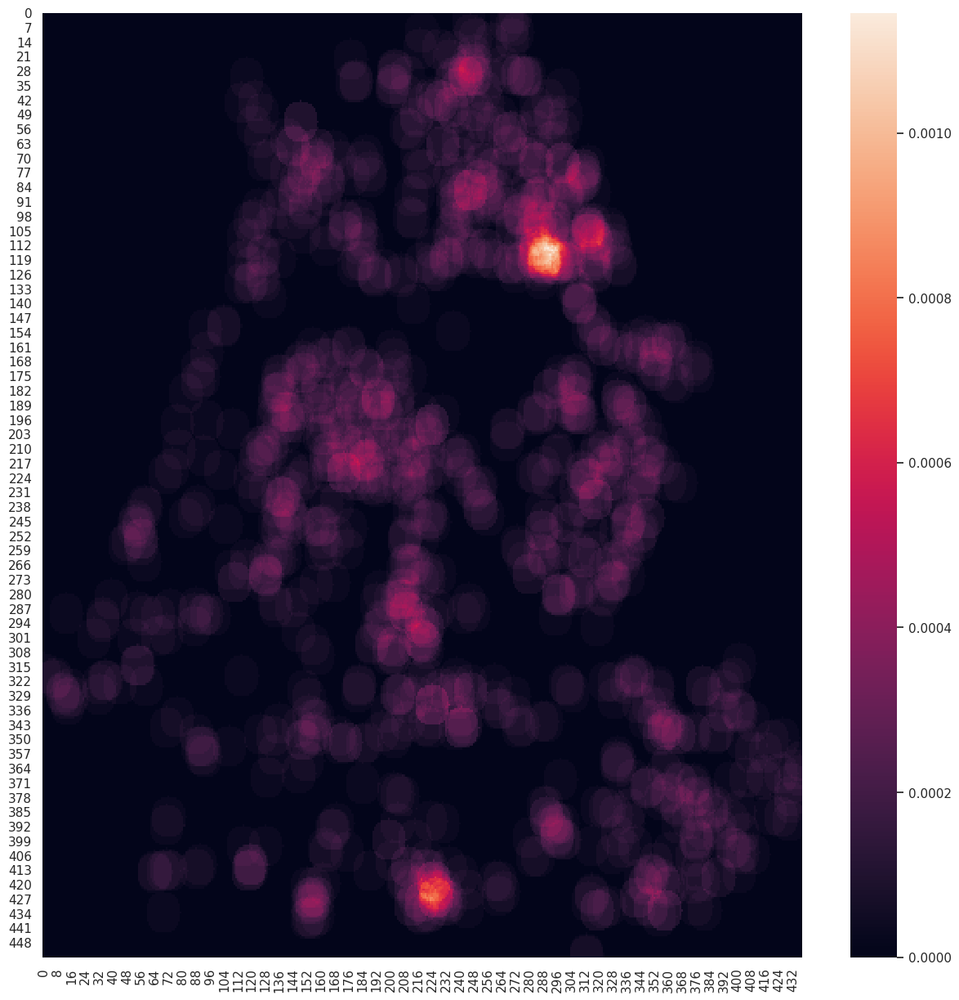

In [ ]:
#Visualizacion de datos
import seaborn as sns
sns.set(rc = {'figure.figsize':(15,15)})
p=sns.heatmap(np.flipud(matriz_dens))

In [ ]:
import colorsys

def rgb_a_hsv(r, g, b):
  (h, s, v) = colorsys.rgb_to_hsv(r, g, b)
  return (h, s, v)

def hsv_a_rgb(h, s, v):
  (r, g, b) = colorsys.hsv_to_rgb(h, s, v)
  r = int(r)
  g = int(g)
  b = int(b)
  return (r, g, b)

<Axes: >

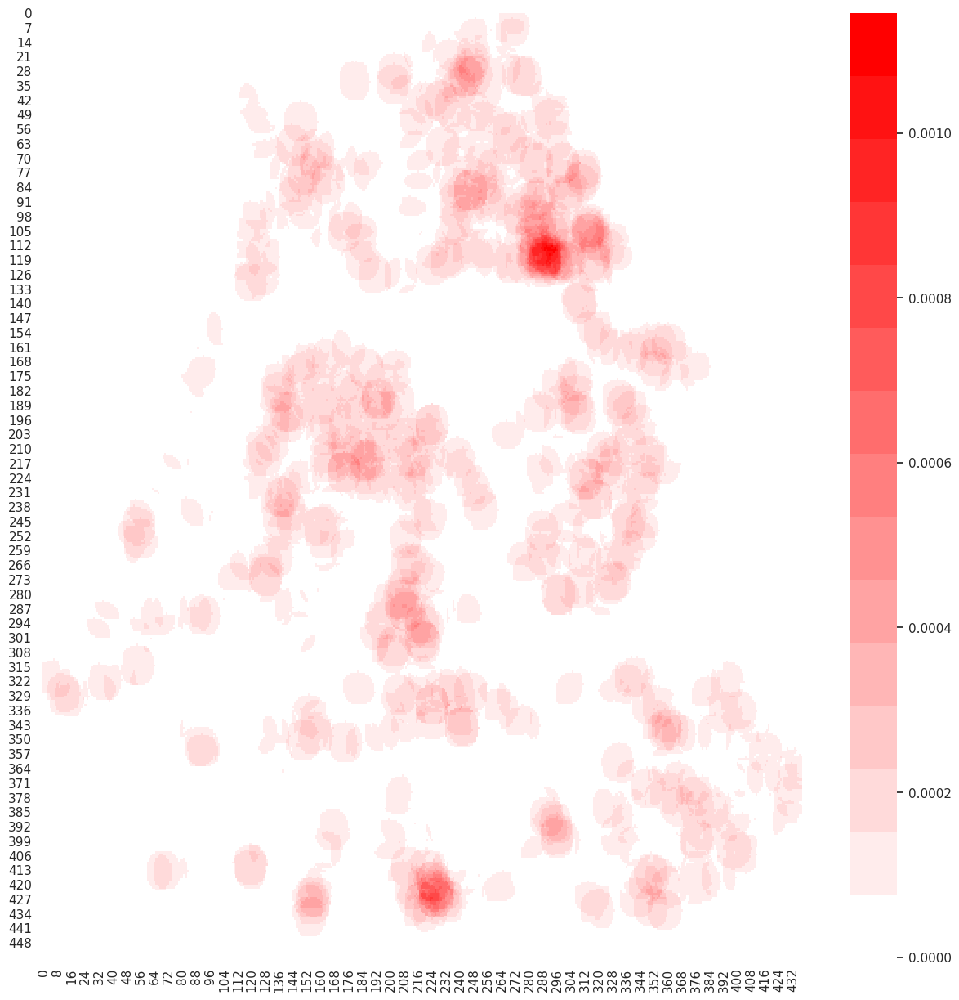

In [ ]:
from PIL import Image, ImageDraw

def pintar_color(r, g, b):
  img = Image.new('RGB', (300, 25))
  draw = ImageDraw.Draw(img)
  draw.rectangle([(0, 0), img.size], fill = (r,g,b))
  display(img)

#Color inicial
r_ini = 255
g_ini = 255
b_ini = 255
hsv_ini = rgb_a_hsv(r_ini, g_ini, b_ini)

#Color final
r_fin = 255
g_fin = 0
b_fin = 0
hsv_fin = rgb_a_hsv(r_fin, g_fin, b_fin)

n = 15
colores = []

for i in range(n):
  h = hsv_ini[0] + i * (hsv_fin[0] - hsv_ini[0]) / (n - 1)
  s = hsv_ini[1] + i * (hsv_fin[1] - hsv_ini[1]) / (n - 1)
  v = hsv_ini[2] + i * (hsv_fin[2] - hsv_ini[2]) / (n - 1)

  (r, g, b) = hsv_a_rgb(h, s, v)
  colores.append((r / 255, g/ 255, b/255))

sns.set(rc={'figure.figsize': (15, 15)})
sns.heatmap(np.flipud(matriz_dens), cmap=colores)

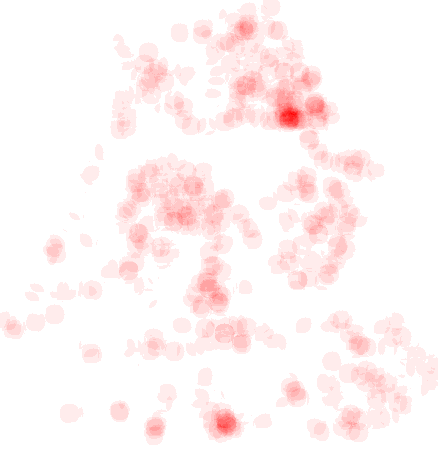

In [ ]:
# Importar las bibliotecas necesarias
from PIL import Image, ImageDraw
import colorsys
import numpy as np

# Calcular los valores mínimo y máximo en la matriz de densidad
min_valor = np.min(matriz_dens)
max_valor = np.max(matriz_dens)

# Normalizar la matriz de densidad en el rango [0, 1]
matriz_dens_normalizada = (matriz_dens - min_valor) / (max_valor - min_valor)

# Crear una imagen con el tamaño de la matriz de densidad
ancho, alto = len(matriz_dens[0]), len(matriz_dens)
imagen = Image.new("RGB", (ancho, alto))
dibujar = ImageDraw.Draw(imagen)

# Iterar a través de la matriz de densidad normalizada y asignar el color correspondiente
for i in range(alto):
    for j in range(ancho):
        valor = matriz_dens_normalizada[i][j]
        color = colores[int(valor * (n - 1))]  # Asignar color de acuerdo al valor normalizado
        dibujar.point((j, i), fill=(int(color[0] * 255), int(color[1] * 255), int(color[2] * 255)))

# Corregir la orientación de la imagen
imagen = imagen.transpose(Image.FLIP_TOP_BOTTOM)

# Guardar la imagen
imagen.save('mapa_de_calor.png')

from IPython.display import Image

# Mostrar la imagen
Image(filename='mapa_de_calor.png')
